<a href="https://colab.research.google.com/github/Ayush0809/Bipedal-Walker-v2/blob/master/Bipedal_Walker_Implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Installing PyTorch

# http://pytorch.org/
from os import path
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())

accelerator = 'cu80' if path.exists('/opt/bin/nvidia-smi') else 'cpu'

!pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.3.0.post4-{platform}-linux_x86_64.whl torchvision
import torch

In [0]:
!pip install gym

    100% |████████████████████████████████| 1.5MB 9.0MB/s 
    100% |████████████████████████████████| 1.0MB 17.8MB/s 
  Running setup.py bdist_wheel for gym ... - \ | / done
  Stored in directory: /content/.cache/pip/wheels/cb/14/71/f4ab006b1e6ff75c2b54985c2f98d0644fffe9c1dddc670925
Successfully built gym


In [0]:
# Installing Libraries for Rendering Animation given by GYM as simply env.render() won't render any animation

!pip install pyvirtualdisplay
!apt-get install xvfb
!apt-get install python-opengl

  Running setup.py bdist_wheel for pyvirtualdisplay ... - \ | / - \ done
  Stored in directory: /content/.cache/pip/wheels/d1/8c/16/1c64227974ae29c687e4cc30fd691d5c0fd40f54446dde99da
  Running setup.py bdist_wheel for EasyProcess ... - \ | / - done
  Stored in directory: /content/.cache/pip/wheels/b4/c6/e3/c163b04029d8fccfd54b809802640c1af587a01be8d7a04e1a
Successfully built pyvirtualdisplay EasyProcess
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libdrm-amdgpu1 libdrm-common libdrm-intel1 libdrm-nouveau2 libdrm-radeon1
  libdrm2 libelf1 libfontenc1 libgl1-mesa-dri libgl1-mesa-glx libglapi-mesa
  libllvm5.0 libpciaccess0 libpixman-1-0 libsensors4 libtxc-dxtn-s2tc
  libx11-xcb1 libxaw7 libxcb-dri2-0 libxcb-dri3-0 libxcb-glx0 libxcb-present0
  libxcb-sync1 libxdamage1 libxfixes3 libxfont1 libxfont2 libxkbfile1 libxmu6
  libxmuu1 libxpm4 libxshmfence1 libxt6 libx

In [0]:
!apt-get install swig
!apt-get install -y python-numpy python-dev cmake zlib1g-dev libjpeg-dev xvfb libav-tools xorg-dev python-opengl libboost-all-dev libsdl2-dev swig
!git clone https://github.com/openai/gym.git
!cd gym
!pwd
!pip install -e .
!pip install -e '.[all]'

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  swig3.0
Suggested packages:
  swig-doc swig-examples swig3.0-examples swig3.0-doc
The following NEW packages will be installed:
  swig swig3.0
0 upgraded, 2 newly installed, 0 to remove and 0 not upgraded.
Need to get 1,080 kB of archives.
After this operation, 5,657 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu artful/universe amd64 swig3.0 amd64 3.0.10-1.2 [1,074 kB]
Get:2 http://archive.ubuntu.com/ubuntu artful/universe amd64 swig amd64 3.0.10-1.2 [6,384 B]
Fetched 1,080 kB in 0s (10.2 MB/s)
Selecting previously unselected package swig3.0.
(Reading database ... 21864 files and directories currently installed.)
Preparing to unpack .../swig3.0_3.0.10-1.2_amd64.deb ...
Unpacking swig3.0 (3.0.10-1.2) ...
Selecting previously unselected package swig.
Preparing to unpack .../swig_3.0.10-1.2_amd64.deb ...
U

In [0]:
!pip install Box2D

# For the error of "AttributeError: module '_Box2D' has no attribute 'RAND_LIMIT_swigconstant'"(See Bookmarks to know more)
!pip3 install box2d box2d-kengz

    100% |████████████████████████████████| 430kB 17.6MB/s 
  Running setup.py bdist_wheel for Box2D ... - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ done
  Stored in directory: /content/.cache/pip/wheels/35/09/fd/054e73da7184a08071ed889bf45772719c7bb6d2dd13f166a1
Successfully built Box2D
    100% |████████████████████████████████| 430kB 18.7MB/s 
  Running setup.py bdist_wheel for box2d-kengz ... - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - done
  Stored in directory: /content/.cache/pip/wheels/75/ae/e5/8bc678d262caad94659c199c540550e59d03dd3bd3684d4f1a
Successfully built box2d-kengz


In [0]:
import time, math, random, bisect, copy
import gym
import numpy as np



class NeuralNet : 
    def __init__(self, nodeCount):     
        self.fitness = 0.0
        self.nodeCount = nodeCount
        self.weights = []
        self.biases = []
        for i in range(len(nodeCount) - 1):
            self.weights.append( np.random.uniform(low=-1, high=1, size=(nodeCount[i], nodeCount[i+1])).tolist() )
            self.biases.append( np.random.uniform(low=-1, high=1, size=(nodeCount[i+1])).tolist())


    def getOutput(self, input):
        output = input
        for i in range(len(self.nodeCount)-1):
            output = np.reshape( np.matmul(output, self.weights[i]) + self.biases[i], (self.nodeCount[i+1]))
        return output       

In [0]:
class Population :
    def __init__(self, populationCount, mutationRate, nodeCount):
        self.nodeCount = nodeCount
        self.popCount = populationCount
        self.m_rate = mutationRate
        self.population = [ NeuralNet(nodeCount) for i in range(populationCount)]


    def createChild(self, nn1, nn2):
        
        child = NeuralNet(self.nodeCount)
        for i in range(len(child.weights)):
            for j in range(len(child.weights[i])):
                for k in range(len(child.weights[i][j])):
                    if random.random() > self.m_rate:
                        if random.random() < nn1.fitness / (nn1.fitness+nn2.fitness):
                            child.weights[i][j][k] = nn1.weights[i][j][k]
                        else :
                            child.weights[i][j][k] = nn2.weights[i][j][k]
                        

        for i in range(len(child.biases)):
            for j in range(len(child.biases[i])):
                if random.random() > self.m_rate:
                    if random.random() < nn1.fitness / (nn1.fitness+nn2.fitness):
                        child.biases[i][j] = nn1.biases[i][j]
                    else:
                        child.biases[i][j] = nn2.biases[i][j]

        return child


    def createNewGeneration(self, bestNN):    
        nextGen = []
        self.population.sort(key=lambda x: x.fitness, reverse=True)
        for i in range(self.popCount):
            if random.random() < float(self.popCount-i)/self.popCount:
                nextGen.append(copy.deepcopy(self.population[i]));

        fitnessSum = [0]
        minFit = min([i.fitness for i in nextGen])
        for i in range(len(nextGen)):
            fitnessSum.append(fitnessSum[i]+(nextGen[i].fitness-minFit)**4)
        

        while(len(nextGen) < self.popCount):
            r1 = random.uniform(0, fitnessSum[len(fitnessSum)-1] )
            r2 = random.uniform(0, fitnessSum[len(fitnessSum)-1] )
            i1 = bisect.bisect_left(fitnessSum, r1)
            i2 = bisect.bisect_left(fitnessSum, r2)
            if 0 <= i1 < len(nextGen) and 0 <= i2 < len(nextGen) :
                nextGen.append( self.createChild(nextGen[i1], nextGen[i2]) )
            else :
                print("Index Error ");
                print("Sum Array =",fitnessSum)
                print("Randoms = ", r1, r2)
                print("Indices = ", i1, i2)
        self.population.clear()
        self.population = nextGen




In [0]:
GAME = 'BipedalWalker-v2'
MAX_STEPS = 1000
MAX_GENERATIONS = 1000
POPULATION_COUNT = 100
MUTATION_RATE = 0.01
env = gym.make(GAME)       # An instance of our environment is made and stored in 'env'
observation = env.reset()
in_dimen = env.observation_space.shape[0]
out_dimen = env.action_space.shape[0]
obsMin = env.observation_space.low
obsMax = env.observation_space.high
actionMin = env.action_space.low
actionMax = env.action_space.high
pop = Population(POPULATION_COUNT, MUTATION_RATE, [in_dimen, 13, 8, 13, out_dimen])
bestNeuralNets = []

print("\nObservation\n--------------------------------")
print("Shape :", in_dimen, " \n High :", obsMax, " \n Low :", obsMin)
print("\nAction\n--------------------------------")
print("Shape :", out_dimen, " | High :", actionMax, " | Low :", actionMin,"\n")

for gen in range(MAX_GENERATIONS):
    genAvgFit = 0.0
    minFit =  1000000
    maxFit = -1000000
    maxNeuralNet = None
    for nn in pop.population:      #pop.population contains the list of all newly created neural nets
        observation = env.reset()
        totalReward = 0
        for step in range(MAX_STEPS):
            #env.render()
            action = nn.getOutput(observation)
            observation, reward, done, info = env.step(action)
            totalReward += reward
            if done:
                break

        nn.fitness = totalReward
        minFit = min(minFit, nn.fitness)
        genAvgFit += nn.fitness
        if nn.fitness > maxFit :
            maxFit = nn.fitness
            maxNeuralNet = copy.deepcopy(nn);

    bestNeuralNets.append(maxNeuralNet)      # We're storing best Neural Net from each generation into 'bestNeuralNets'
    genAvgFit/=pop.popCount
    print("Generation : %3d  |  Min : %5.0f  |  Avg : %5.0f  |  Max : %5.0f  " % (gen+1, minFit, genAvgFit, maxFit) )
    pop.createNewGeneration(maxNeuralNet)

#recordBestBots(bestNeuralNets)

#uploadSimulation()

replayBestBots(bestNeuralNets, max(1, int(math.ceil(MAX_GENERATIONS/10.0))), 0.0625)



WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.

Observation
--------------------------------
Shape : 24  
 High : [inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf inf
 inf inf inf inf inf inf]  
 Low : [-inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf]

Action
--------------------------------
Shape : 4  | High : [1. 1. 1. 1.]  | Low : [-1. -1. -1. -1.] 

Generation :   1  |  Min :  -154  |  Avg :  -113  |  Max :   -87  
Generation :   2  |  Min :  -156  |  Avg :  -111  |  Max :   -87  
Generation :   3  |  Min :  -188  |  Avg :  -110  |  Max :   -87  
Generation :   4  |  Min :  -146  |  Avg :  -109  |  Max :   -83  
Generation :   5  |  Min :  -154  |  Avg :  -110  |  Max :   -74  
Generation :   6  |  Min :  -157  |  Avg :  -109  |  Max :   -60 

NameError: ignored

Generation 100 | Expected Fitness of  -33 | Actual Fitness =  -40
Generation 200 | Expected Fitness of  -42 | Actual Fitness =  -39
Generation 300 | Expected Fitness of   28 | Actual Fitness =   28
Generation 400 | Expected Fitness of  146 | Actual Fitness =  128
Generation 500 | Expected Fitness of  169 | Actual Fitness =  178
Generation 600 | Expected Fitness of  181 | Actual Fitness =  158
Generation 700 | Expected Fitness of  169 | Actual Fitness =  -13
Generation 800 | Expected Fitness of  206 | Actual Fitness =  -28
Generation 900 | Expected Fitness of  178 | Actual Fitness =  172
Generation 1000 | Expected Fitness of  185 | Actual Fitness = -107


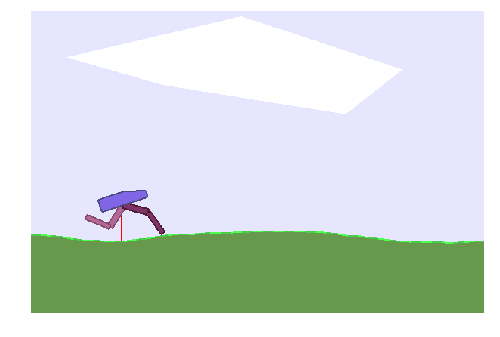

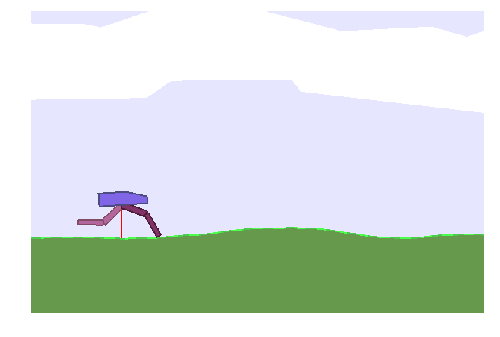

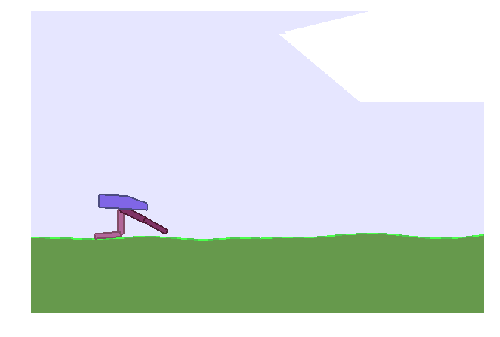

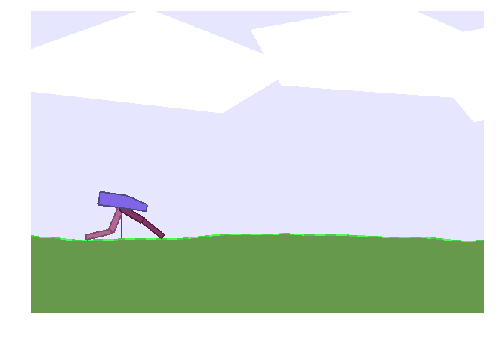

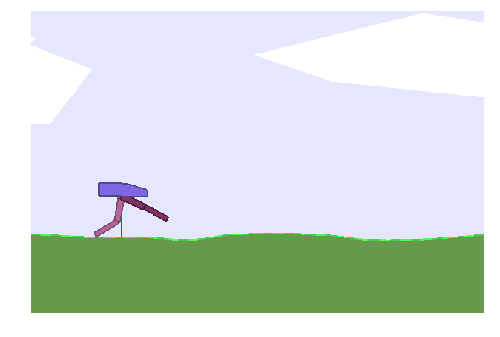

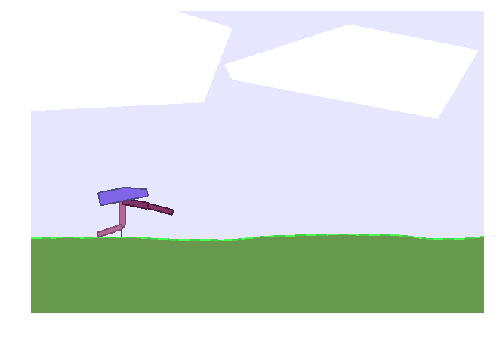

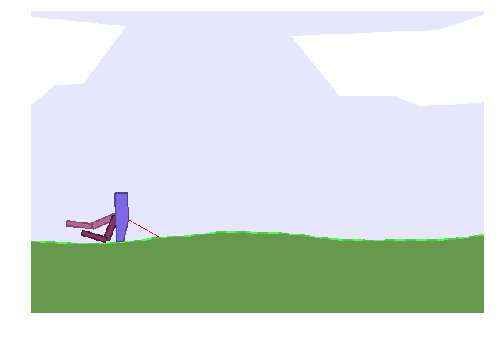

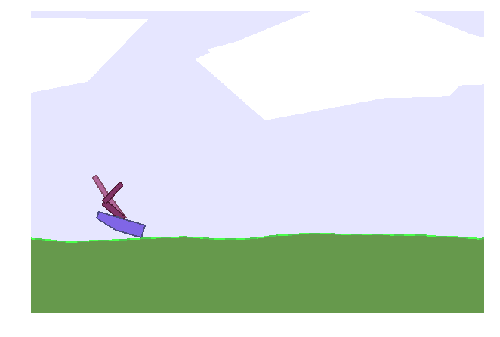

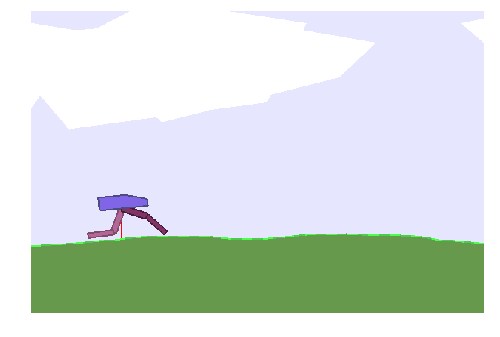

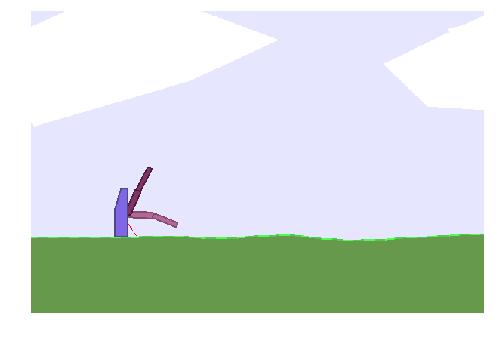

In [0]:
replayBestBots(bestNeuralNets, max(1, int(math.ceil(MAX_GENERATIONS/10.0))), 0.0625)

In [0]:
arg = bestNeuralNets[-1]

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
test episode: 0 R: 174.63218203936512
test episode: 1 R: 178.3245168621827
test episode: 2 R: 200.2701857124429


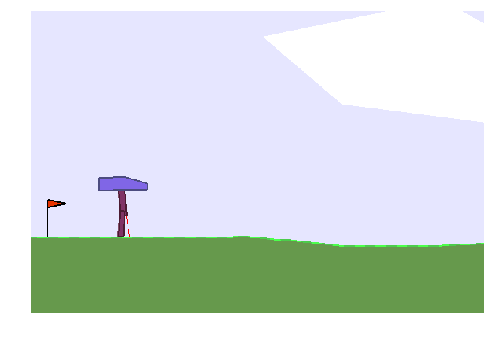

In [0]:
# Code that'll Render the animation(See Bookmarks to find code's understanding)

# Start virtual display
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1024, 768))
display.start()
import os
os.environ["DISPLAY"] = ":" + str(display.display) + "." + str(display.screen)

import gym
env = gym.make('BipedalWalker-v2')


# What we're doing here is that we're storing each frame rendered into 'frames' list and then rendering those frames in 'frames' list
# using animations in matplotlib and HTML(Refer to Bookmarks "openAI Gym NameError in Google Colaboratory" Link for the 3rd answer by 'Yograj Singh Mandloi')
frames = []
for i in range(3):      # Note that since total number of episodes is just 3, thus after falling 3 times or completing 200 states the animation stops
    obs = env.reset()
    done = False
    R = 0
    t = 0
    #s = [-1,-1,-1,-1]
    while not done and t < 1000:
        frames.append(env.render(mode = 'rgb_array'))
        
        '''for ix in range(4):
          if s[ix] > 1:
            s[ix]=-1
            
          else:
            s[ix] += 0.25
        '''
        action = arg.getOutput(obs)
        obs, r, done, _ = env.step(action)     
        R += r
        t += 1
    print('test episode:', i, 'R:', R)
env.render()

import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

In [0]:
import numpy as np

In [0]:
a = np.array([])
b = np.array([])
error = np.linalg.norm(a-b)

In [0]:
error

0.0

In [0]:
l = [1,2,3,4,5]

In [0]:
print("list is {}".format(l))

list is [1, 2, 3, 4, 5]
